In [62]:
from shapely.geometry import Polygon, Point, MultiLineString

import mapclassify

In [63]:
import networkx as nx
import osmnx as ox

In [64]:
import overpass
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import cdist, pdist
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree

In [93]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
from pysal.viz import mapclassify

import folium
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import warnings
warnings.filterwarnings("ignore")

plt.rcParams['figure.figsize'] = 15, 10
%matplotlib inline

## Задачи геоаналитики


- Explorative data analysis
- Spatial clustering/spatial autocorrelation
- Visualization/dashbord

## Форматы хранения геоданных

- Пространственные данные  (вектор)
    - .shp, .geojson, .json, .kml, .gpkg
    - .txt, .csv, .xls
- Пространственные данные  (растр)
    - .geotiff, .tiff, .jpeg, .asc 

#### Загружаем административно-территориальное деление Нью-Йорка

In [193]:
nyc = gpd.read_file('data/new-york-city-boroughs.geojson')

nyc.head()

,name,cartodb_id,created_at,updated_at,geometry
0,Staten Island,1,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-74.05050799999999 40.566422, -74.0..."
1,Queens,2,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.83668299999999 40.594947, -73.8..."
2,Brooklyn,3,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.86706100000001 40.582088, -73.8..."
3,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-74.01092800000001 40.684491, -74.0..."
4,Bronx,5,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.896809 40.795808, -73.896939 40..."


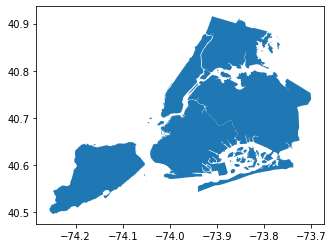

In [196]:
nyc.plot();

#### Загрузка данных из OSM с помощью overpass-api

[OSM Overpass API](https://wiki.openstreetmap.org/wiki/RU:Overpass_API)

![Image of Yaktocat](https://cdn-images-1.medium.com/max/1600/1*naEo03Ssn3-69xzLZIpZPQ.png)

[Overpass turbo](http://overpass-turbo.eu/)

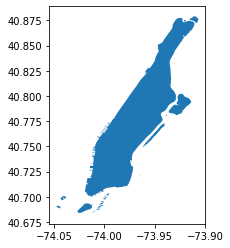

In [214]:
manhattan = nyc[nyc['name'] == 'Manhattan'].reset_index(drop=True)
manhattan.plot()

In [213]:
api = overpass.API(endpoint="https://overpass.kumi.systems/api/interpreter")
response = api.get('node["name"="Empire State Building"]')
response

{"features": [{"geometry": {"coordinates": [28.0440305, 43.2844294], "type": "Point"}, "id": 2407752390, "properties": {"man_made": "tower", "name": "Eiffel Tower", "name:de": "Eiffelturm", "name:en": "Eiffel Tower", "tourism": "attraction"}, "type": "Feature"}, {"geometry": {"coordinates": [-116.235, 51.3336], "type": "Point"}, "id": 2689315641, "properties": {"ele": "3080", "name": "Eiffel Tower", "natural": "peak"}, "type": "Feature"}, {"geometry": {"coordinates": [116.280439, 39.8092398], "type": "Point"}, "id": 3184358208, "properties": {"man_made": "tower", "name": "Eiffel Tower", "tourism": "attraction"}, "type": "Feature"}, {"geometry": {"coordinates": [-95.5238698, 33.6398652], "type": "Point"}, "id": 3880146677, "properties": {"man_made": "tower", "name": "Eiffel Tower"}, "type": "Feature"}, {"geometry": {"coordinates": [74.1849977, 31.3556191], "type": "Point"}, "id": 4427371617, "properties": {"historic": "monument", "name": "Eiffel Tower"}, "type": "Feature"}, {"geometry":

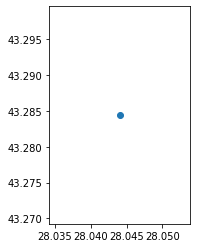

In [215]:
empire_state_building = gpd.GeoDataFrame(geometry=[Point(response[0]['geometry']['coordinates'])], 
                                         crs={'init': 'epsg:4326'})
empire_state_building.plot();

In [216]:
response = api.get('node["name"="Eiffel Tower"]')
eiffel_tower = gpd.GeoDataFrame(geometry=[Point(response[0]['geometry']['coordinates'])], 
                                crs={'init': 'epsg:4326'})

In [217]:
manhattan.contains(empire_state_building)

0    False
dtype: bool

In [218]:
manhattan.contains(eiffel_tower)

0    False
dtype: bool

In [12]:
gpd.sjoin(empire_state_building, nyc)

,geometry,index_right,name,cartodb_id,created_at,updated_at
0,POINT (-73.98499579999999 40.7481628),3,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03


In [13]:
print(empire_state_building.crs, nyc.crs)

{'init': 'epsg:4326'} {'init': 'epsg:4326'}


## Системы координат

<img src=https://ours-nature.ru/new_site/img/991345842/i_019.jpg width="75%">

<img src=https://www.syfy.com/sites/syfy/files/wire/legacy/bad_astronomy/lumpy_earth_without_water_0.jpg width="75%">

### Москва и разные проекции

<img src=images/msc_crs.png width="100%">

In [14]:
manhattan = manhattan.to_crs(epsg='3857')
empire_state_building = empire_state_building.to_crs(epsg='3857')

In [15]:
empire_state_building

,geometry
0,POINT (-8235972.058798483 4975266.399617112)


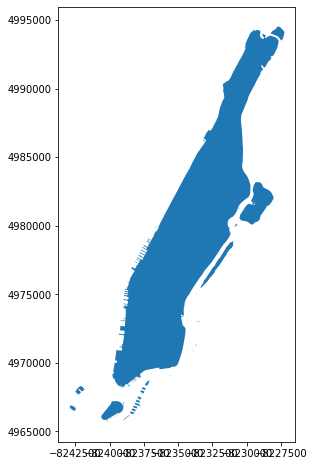

In [16]:
ax = manhattan.plot(figsize=(10, 8))

- [EPSG](https://epsg.io/)
- [Spatial reference list](https://spatialreference.org/ref/epsg/)

## Пространственные операции

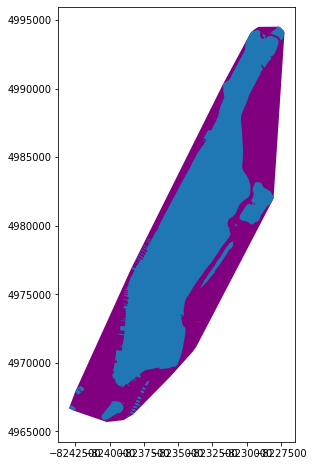

In [17]:
ax = manhattan.convex_hull.plot(color='purple', figsize=(10, 8))
ax = manhattan.plot(ax=ax)

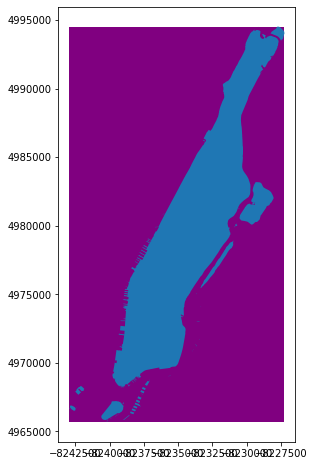

In [18]:
ax = manhattan.envelope.plot(color='purple', figsize=(10, 8))
ax = manhattan.plot(ax=ax)

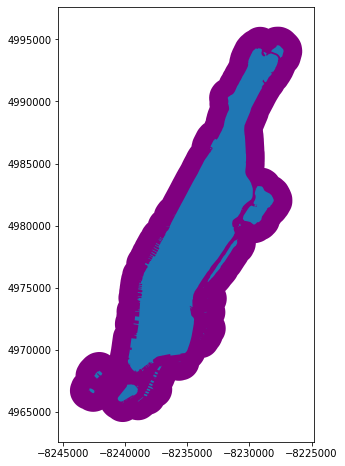

In [19]:
ax = manhattan.buffer(1500).plot(color='purple',  figsize=(10, 8))
ax = manhattan.plot(ax=ax)

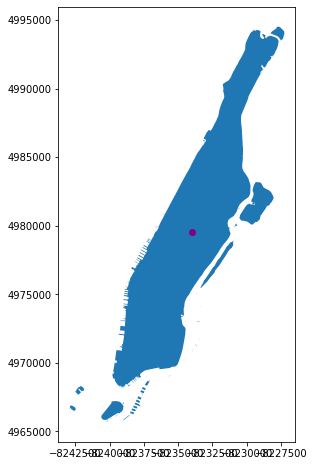

In [20]:
ax = manhattan.plot(figsize=(10, 8))
ax = manhattan.centroid.plot(ax=ax, color='purple')

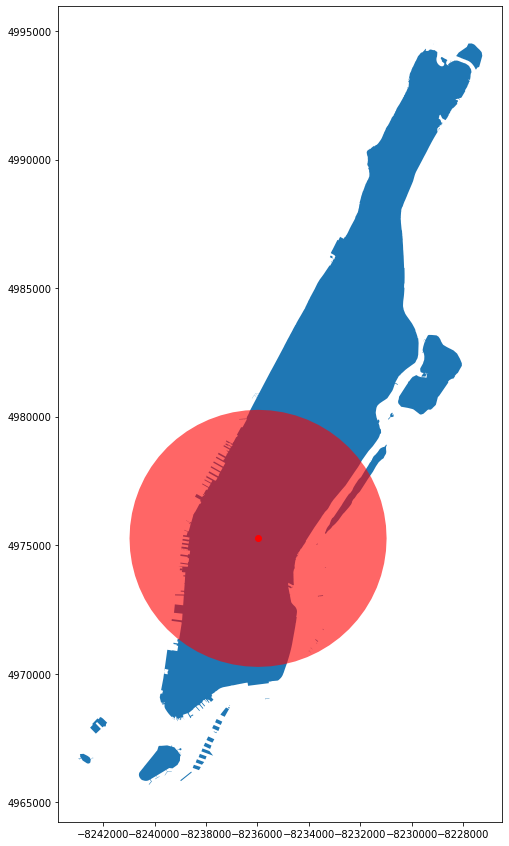

In [22]:
es_buffer = empire_state_building.buffer(5000)

ax = manhattan.plot(figsize=(10, 15))
ax = es_buffer.plot(color='r', ax=ax, alpha=0.6)
ax = empire_state_building.plot(ax=ax, color='r')

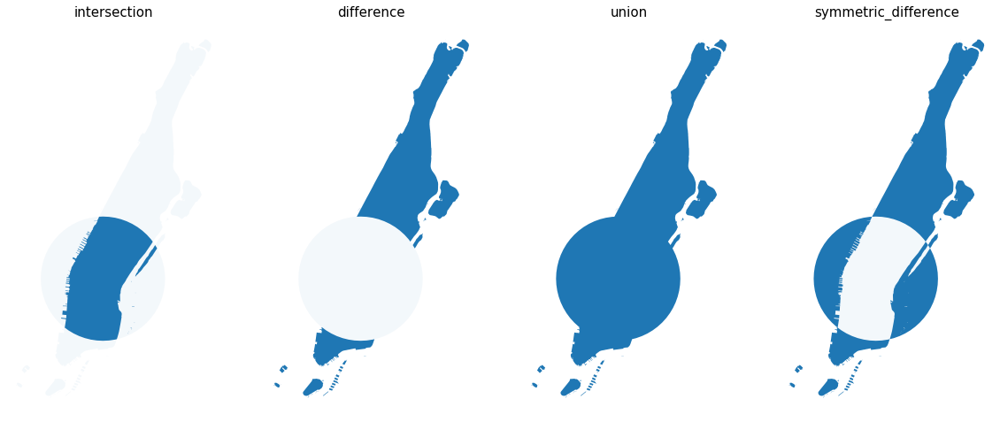

In [23]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20))

polys = [manhattan.intersection(es_buffer),
manhattan.difference(es_buffer),
manhattan.union(es_buffer),
manhattan.symmetric_difference(es_buffer)]

titles = ['intersection', 'difference', 'union', 'symmetric_difference']

for x, ax in enumerate(axes.flatten()):
    ax = manhattan.union(es_buffer).plot(alpha=0.05, ax=ax)
    ax = polys[x].plot(ax=ax)
    ax.set_title(titles[x], size=15)
    ax.axis('off')

plt.show()

In [24]:
manhattan = manhattan.to_crs(epsg='4326')
empire_state_building = empire_state_building.to_crs(epsg='4326')

In [25]:
%%time
df = pd.read_csv('data/train_2015.csv')

CPU times: user 4.03 s, sys: 344 ms, total: 4.37 s
Wall time: 4.53 s


tut plot

In [26]:
df = df[df['dropoff_longitude'] != 0].reset_index(drop=True)

In [27]:
df.shape

(1458644, 11)

In [219]:
gdf = df[:500000]
gdf = gpd.GeoDataFrame(gdf,
                       geometry=[Point(x,y) for x,y in zip(gdf['dropoff_longitude'], gdf['dropoff_latitude'])])

In [29]:
lon_min = -74.103095
lat_min = 40.597399
lon_max = -73.729243
lat_max = 40.906114

CPU times: user 33 s, sys: 372 ms, total: 33.4 s
Wall time: 33.4 s


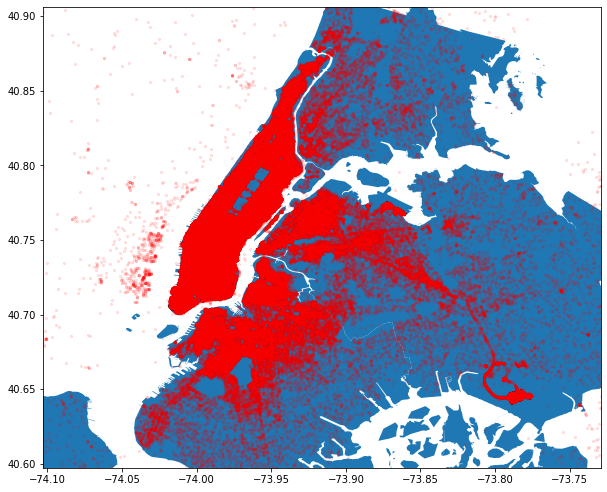

In [30]:
%%time
ax = nyc.plot(figsize=(10, 15))
ax = gdf.plot(ax=ax, color='red', markersize=5, alpha=0.1)
ax.set_xlim((lon_min,lon_max))
ax.set_ylim((lat_min,lat_max))

In [ ]:
xy = gdf['geometry'].map(lambda point: point.xy)
x,y = zip(*xy)

CPU times: user 11.7 s, sys: 194 ms, total: 11.9 s
Wall time: 11.8 s


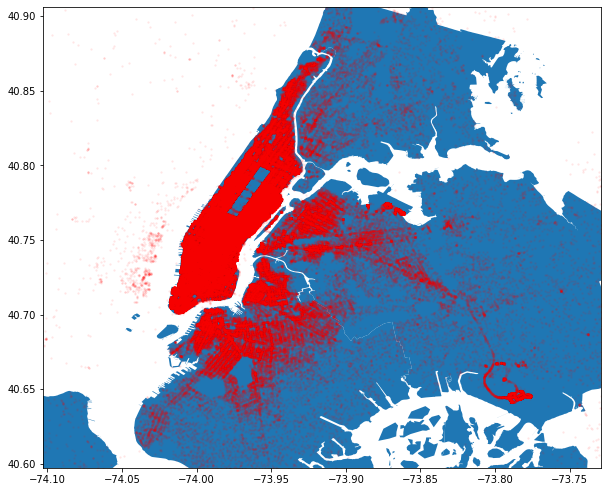

In [31]:
%%time
ax = nyc.plot(figsize=(10, 15))
ax.scatter(x, y, s=5, color='red', linewidth=0, alpha=0.1)
ax.set_xlim((lon_min,lon_max))
ax.set_ylim((lat_min,lat_max))

In [32]:
m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

In [220]:
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

df['pickup_latitude'] = df['pickup_latitude'].astype(float)
df['pickup_longitude'] = df['pickup_longitude'].astype(float)

df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:20000]
df_for_heatmap = df_for_heatmap.dropna(axis=0, subset=['pickup_latitude','pickup_longitude'])
# List comprehension to make out list of lists
heat_data = [[row['pickup_latitude'],row['pickup_longitude']] for index, row in df_for_heatmap.iterrows()]
# Plot it on the map
HeatMap(heat_data,
        radius=10).add_to(m)
# Display the map
m

In [221]:
zones = gpd.read_file('data/taxi_zones.geojson')

zones.head(2)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"(POLYGON ((-74.184453 40.6949959999999, -74.18..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-73.82337597260664 40.6389870471767...


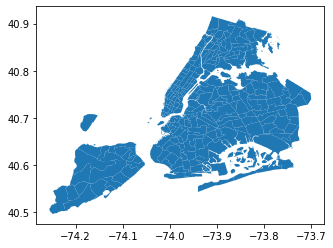

In [222]:
zones.plot();

In [36]:
%%time
df = gpd.GeoDataFrame(df, geometry=[Point(x,y) for x,y in zip(df['dropoff_longitude'], df['dropoff_latitude'])])

CPU times: user 11.9 s, sys: 408 ms, total: 12.3 s
Wall time: 12.6 s


In [37]:
%%time
joined = gpd.sjoin(df, zones)

CPU times: user 1min 29s, sys: 2.45 s, total: 1min 31s
Wall time: 1min 32s


In [38]:
%%time
joined = gpd.sjoin(df, zones, op='within')

CPU times: user 59.6 s, sys: 3.56 s, total: 1min 3s
Wall time: 1min 7s


In [224]:
joined.head(3)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry,index_right,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,POINT (-73.96463012695312 40.76560211181641),236,237,0.042213,0.000096,Upper East Side South,237,Manhattan
13,id0799785,2,2016-06-01 20:58:29,2016-06-01 21:02:49,1,-73.956306,40.767941,-73.966110,40.763000,N,260,POINT (-73.96611022949219 40.76300048828125),236,237,0.042213,0.000096,Upper East Side South,237,Manhattan
69,id0913838,2,2016-02-03 16:22:50,2016-02-03 16:37:20,5,-73.978333,40.754070,-73.959732,40.772758,N,870,POINT (-73.95973205566406 40.77275848388672),236,237,0.042213,0.000096,Upper East Side South,237,Manhattan


In [230]:
counts = joined[['zone', 'index_right']].groupby('zone').count()\
                .reset_index()\
                .rename(columns={'index_right':'trip_count'})
        
zones = pd.merge(zones, counts, on='zone')

In [231]:
zones.head(2)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,trip_count
0,1,0.116357,0.000782,Newark Airport,1,EWR,"(POLYGON ((-74.184453 40.6949959999999, -74.18...",2591
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-73.82337597260664 40.6389870471767...,3


In [233]:
['box_plot', 'equal_interval', 'fisher_jenks',
 'fisher_jenks_sampled', 'headtail_breaks', 'jenks_caspall',
 'jenks_caspall_forced', 'jenks_caspall_sampled', 'max_p_classifier',
 'maximum_breaks', 'natural_breaks', 'quantiles', 'percentiles', 'std_mean', 'user_defined']

['box_plot',
 'equal_interval',
 'fisher_jenks',
 'fisher_jenks_sampled',
 'headtail_breaks',
 'jenks_caspall',
 'jenks_caspall_forced',
 'jenks_caspall_sampled',
 'max_p_classifier',
 'maximum_breaks',
 'natural_breaks',
 'quantiles',
 'percentiles',
 'std_mean',
 'user_defined']

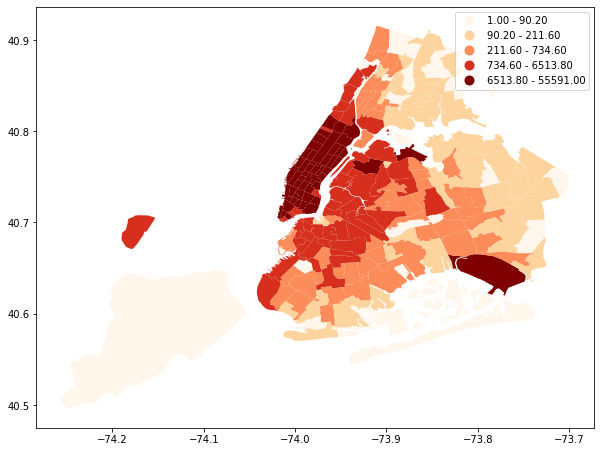

In [40]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='quantiles',
           legend=True)

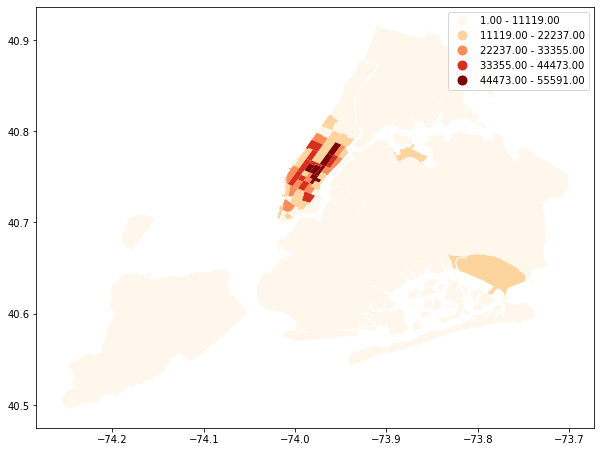

In [41]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='equal_interval',
           legend=True)

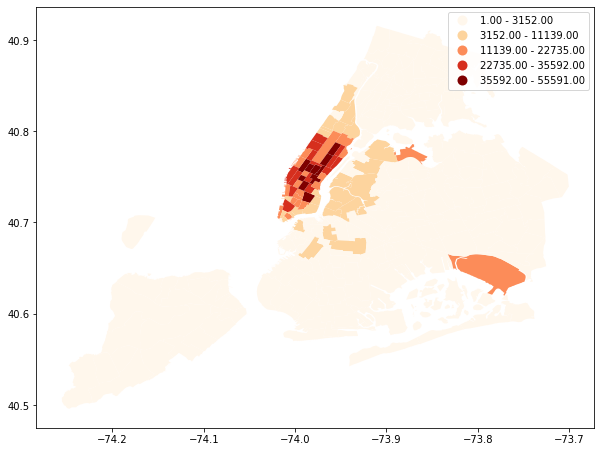

In [42]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='fisher_jenks',
           legend=True)

In [234]:
bins = 5

district_stats_pd = zones.drop(labels='geometry', axis=1)

l = folium.Map(location=[40.730610, -73.935242], 
               zoom_start=11,
               tiles = "CartoDB positron")

folium.Choropleth(
    geo_data=zones,
    data=district_stats_pd,
    columns=['zone','trip_count'],
    key_on = 'feature.properties.zone',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=bins,
    legend_name='Trip Count'
).add_to(l)

l

# POPUP ADD

In [235]:
import osmnx as ox
ox.config(log_console=True, use_cache=True)
ox.__version__

'0.10'

In [46]:
%%time
G = ox.graph_from_bbox(lat_max, lat_min, lon_max, lon_min,
                        network_type='drive')

ConnectionError: HTTPConnectionPool(host='overpass-api.de', port=80): Max retries exceeded with url: /api/interpreter (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x12fca5748>: Failed to establish a new connection: [Errno 60] Operation timed out',))

In [ ]:
#G = ox.project_graph(G)

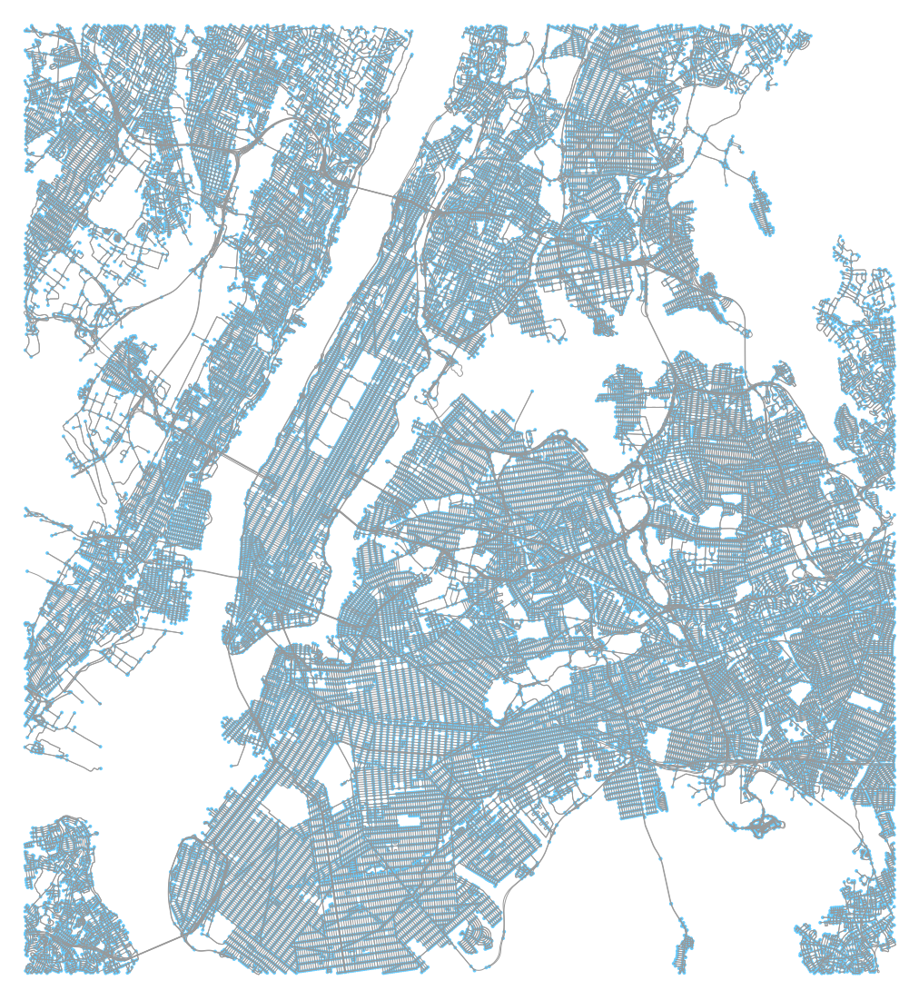

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cd4a3898>)

In [83]:
ox.plot_graph(G, fig_height=20, fig_width=20)

In [84]:
gdf_nodes = ox.graph_to_gdfs(G, edges=False)

In [106]:
gdf_nodes.tail(5)

,highway,osmid,ref,x,y,geometry
42729464,NaN,42729464,NaN,-73.906448,40.901035,POINT (-73.9064482 40.9010349)
42467323,traffic_signals,42467323,NaN,-73.937518,40.654916,POINT (-73.937518 40.654916)
42467324,traffic_signals,42467324,NaN,-73.936548,40.654976,POINT (-73.936548 40.654976)
42467325,traffic_signals,42467325,NaN,-73.935578,40.655039,POINT (-73.93557800000001 40.655039)
42860543,NaN,42860543,NaN,-73.941771,40.743831,POINT (-73.9417706 40.7438315)


In [113]:
len(df)

2892285

In [ ]:
tree = KDTree(gdf_nodes[['y', 'x']], metric='euclidean')

In [104]:
def find_nearest_node(tree, gdf, point):
    
    closest_idx = tree.query([(point.y, point.x)], k=1, return_distance=False)[0]
    nearest_node = gdf.iloc[closest_idx].index.values[0]
    
    return nearest_node

In [118]:
closest_node_to_es = find_nearest_node(tree, gdf_nodes, empire_state_building['geometry'][0])

In [126]:
closest_node_to_es

42446701

DOBAVIT EWE TO4KU

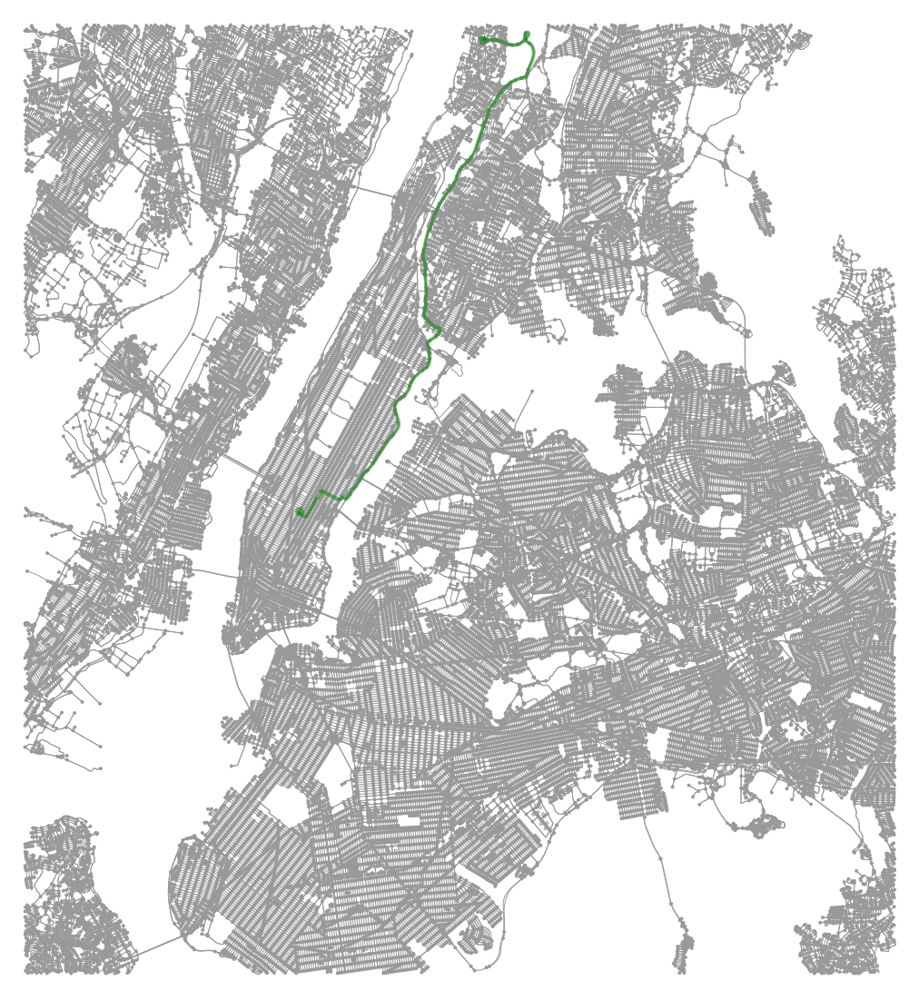

In [120]:
route = nx.shortest_path(G, closest_node_to_es, 42729464)

fig, ax = ox.plot_graph_route(G, route,
                              show=False, close=False, 
                              orig_dest_node_color='green',
                              route_color='green',
                              fig_height=20,
                              fig_width=20)

plt.show()

In [90]:
m = ox.plot_route_folium(G, 
                         route, 
                         route_color='green', route_opacity=0.7, route_width=3)
m

In [91]:
route[:5]

[42446701, 42443680, 42445899, 4597668020, 42449308]

In [92]:
ox.node_list_to_coordinate_lines(G, route)[:5]

[[(-73.985046, 40.747773), (-73.9854922, 40.747168)],
 [(-73.9854922, 40.747168),
  (-73.9851684, 40.7470315),
  (-73.9840491, 40.7465597),
  (-73.9838963, 40.7464898)],
 [(-73.9838963, 40.7464898),
  (-73.9838009, 40.7464499),
  (-73.9823187, 40.7458297)],
 [(-73.9823187, 40.7458297), (-73.9822164, 40.7457862)],
 [(-73.9822164, 40.7457862),
  (-73.9820664, 40.7459924),
  (-73.9818111, 40.7463434),
  (-73.9817748, 40.7464005)]]

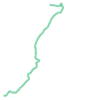

In [93]:
MultiLineString(ox.node_list_to_coordinate_lines(G, route))

In [238]:
es_buffer = empire_state_building.to_crs(epsg=3857).buffer(50)

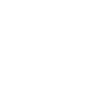

In [239]:
gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0]

In [240]:
%%time
matches = df.intersects(gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0])
matches = df[matches]

CPU times: user 7.4 s, sys: 1.02 s, total: 8.42 s
Wall time: 8.92 s


In [99]:
matches.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry
787,id2024551,2,2016-02-05 09:33:40,2016-02-05 09:50:57,1,-73.991837,40.731194,-73.984970,40.747818,N,1037,POINT (-73.98497009277344 40.74781799316406)
1003,id3892641,1,2016-05-09 20:18:42,2016-05-09 20:26:11,1,-73.974724,40.761276,-73.984802,40.748276,N,449,POINT (-73.98480224609375 40.74827575683594)
1719,id1721766,2,2016-06-18 11:40:57,2016-06-18 11:52:45,1,-73.972290,40.763256,-73.984856,40.748264,N,708,POINT (-73.98485565185547 40.74826431274415)
2027,id3624818,2,2016-05-22 18:46:57,2016-05-22 18:54:18,1,-73.981476,40.758705,-73.984756,40.748333,N,441,POINT (-73.98475646972656 40.74833297729492)
2500,id3052943,1,2016-05-27 09:29:55,2016-05-27 09:41:49,3,-73.974792,40.761471,-73.984932,40.747921,N,714,POINT (-73.98493194580078 40.74792098999024)


#### R-tree for populated places  -поднять вверх

![Image of Yaktocat](https://cdn-images-1.medium.com/max/2600/1*RsZ300nAnsPCxrd2bu5sQw.png)

In [100]:
%%time
sindex = df.sindex

CPU times: user 8 µs, sys: 14 µs, total: 22 µs
Wall time: 25.3 µs


In [101]:
%%time
possible_matches_index = list(sindex.intersection(gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0].bounds))
possible_matches = df.iloc[possible_matches_index]
precise_matches = possible_matches[possible_matches.intersects(gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326)['geometry'][0])]

CPU times: user 292 ms, sys: 477 ms, total: 769 ms
Wall time: 867 ms


In [52]:
%%time
sjoin_matches = gpd.sjoin(df, gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326))

CPU times: user 1min 8s, sys: 2.8 s, total: 1min 10s
Wall time: 1min 13s


In [102]:
len(precise_matches)

2418

In [71]:
sjoin_matches.head(2)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry,index_right
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,POINT (-73.96463012695312 40.76560211181641),0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,POINT (-73.99948120117188 40.73115158081055),0


In [55]:
manhattan

,name,cartodb_id,created_at,updated_at,geometry
0,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03,(POLYGON ((-74.01092800000001 40.6844910000000...


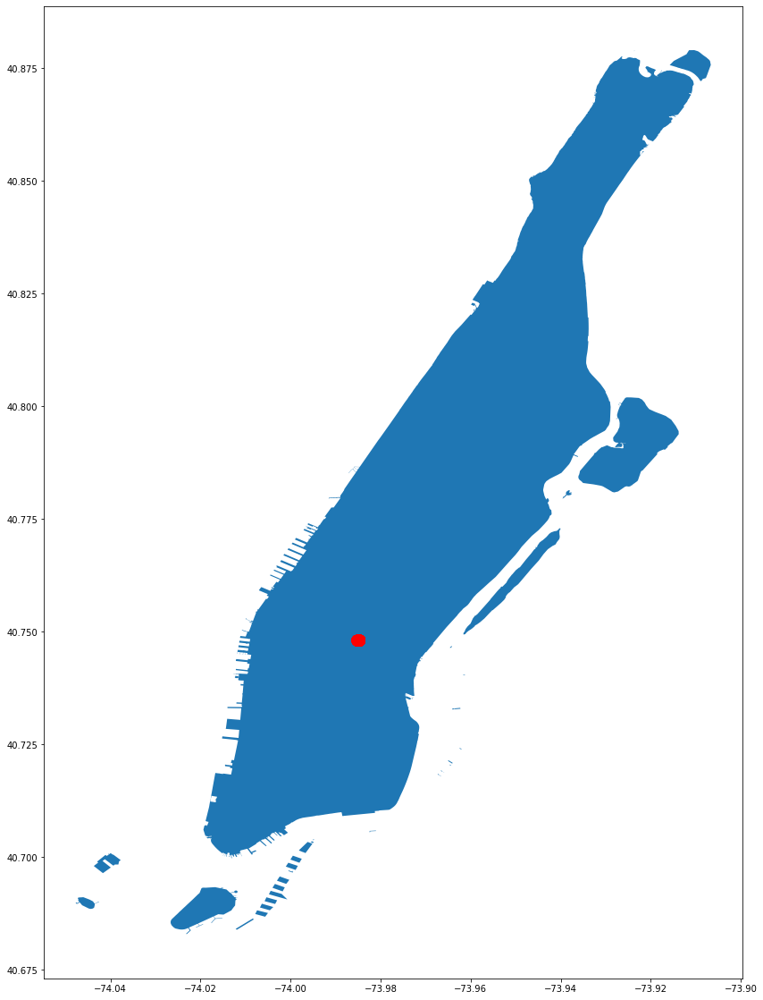

In [241]:
ax = manhattan.to_crs(epsg=4326).plot(figsize=(20,20))
ax = precise_matches.plot(ax = ax, c='red')

In [245]:
empire_state_building.geometry[0].xy

(array('d', [28.0440305]), array('d', [43.2844294]))

In [243]:
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], zoom_start=13, tiles='cartodbpositron')

#df['pickup_latitude'] = df['pickup_latitude'].astype(float)
#df['pickup_longitude'] = df['pickup_longitude'].astype(float)

#df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:20000]
#df_for_heatmap = df_for_heatmap.dropna(axis=0, subset=['pickup_latitude','pickup_longitude'])
# List comprehension to make out list of lists
folium.GeoJson(precise_matches.to_json()).add_to(m)
# Display the map
m

In [303]:
precise_matches.head(2)

,RateCodeID,VendorID,dropoff_latitude,dropoff_longitude,extra,fare_amount,improvement_surcharge,mta_tax,passenger_count,payment_type,pickup_latitude,pickup_longitude,store_and_fwd_flag,tip_amount,tolls_amount,total_amount,tpep_dropoff_datetime,tpep_pickup_datetime,trip_distance,geometry
1700162,1.0,1,40.768787,-73.961250,0.0,16.5,0.3,0.5,1,1,40.751255,-73.994156,N,1.7,0.0,19.0,2015-07-11 15:28:43,2015-07-11 15:05:26,2.90,POINT (-73.96125030517578 40.7687873840332)
1212233,1.0,2,40.768795,-73.961205,1.0,27.0,0.3,0.5,1,2,40.733929,-73.990829,N,0.0,0.0,28.8,2015-05-14 18:26:45,2015-05-14 17:39:40,3.28,POINT (-73.96120452880859 40.76879501342773)


In [247]:
precise_matches['closest_to_pickup_node'] = [find_nearest_node(
    tree, gdf_nodes, Point(x,y)) for x,y in zip(precise_matches['pickup_longitude'], 
                                                precise_matches['pickup_latitude'])]
precise_matches['closest_to_dropoff_node'] = [find_nearest_node(
    tree, gdf_nodes, Point(x,y)) for x,y in zip(precise_matches['dropoff_longitude'],
                                                precise_matches['dropoff_latitude'])]

NameError: name 'find_nearest_node' is not defined

In [246]:
precise_matches[['geometry',
                 'closest_to_pickup_node', 
                 'closest_to_dropoff_node']].head(2)

KeyError: "['closest_to_dropoff_node', 'closest_to_pickup_node'] not in index"

In [360]:
from tqdm import tqdm_notebook as tqdm

In [240]:
manhattan.centroid[0].x

-73.96716037039859

In [361]:
routes = []

for row in tqdm(precise_matches.iterrows()):
    try:
        route = nx.shortest_path(G, row[1].closest_to_pickup_node, row[1].closest_to_dropoff_node)
        routes.append(MultiLineString(ox.node_list_to_coordinate_lines(G, route)))
    except:
        routes.append(Point(manhattan.centroid[0].x, manhattan.centroid[0].y))

In [364]:
precise_matches['geometry'] = routes

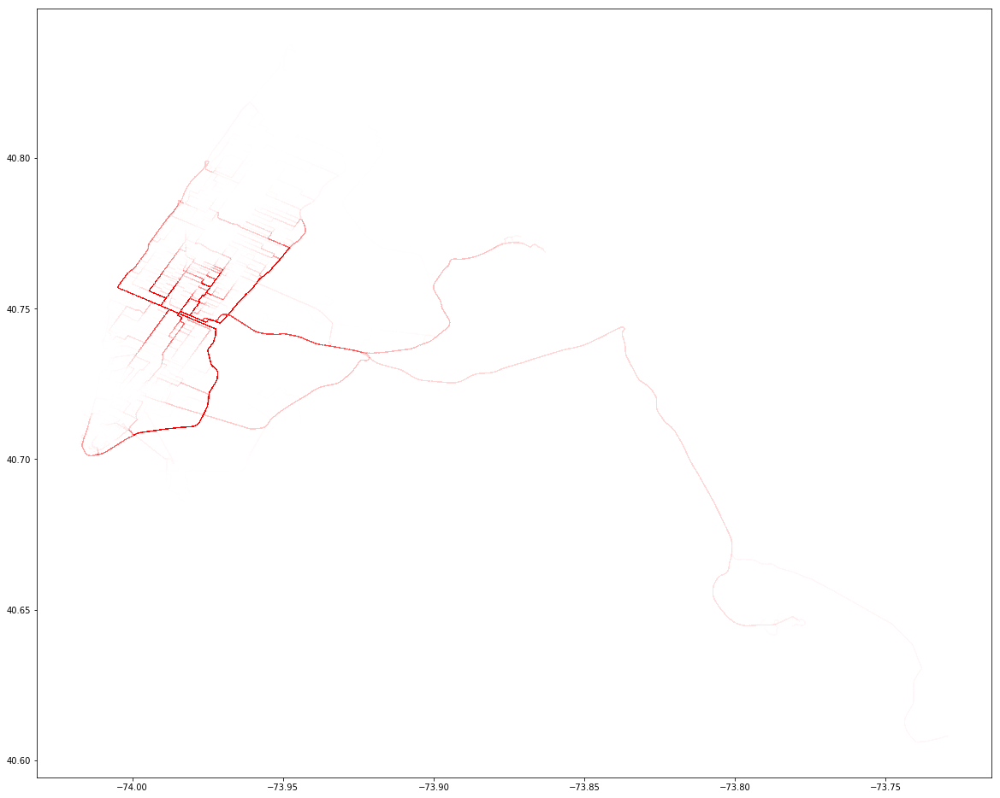

In [365]:
precise_matches.plot(figsize=(20, 25), color='red', alpha=0.005)

In [ ]:
df.head(2)

In [ ]:
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

df['pickup_latitude'] = df['pickup_latitude'].astype(float)
df['pickup_longitude'] = df['pickup_longitude'].astype(float)

df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:10000]
df_for_heatmap = df_for_heatmap.dropna(axis=0, subset=['pickup_latitude','pickup_longitude'])
# List comprehension to make out list of lists
heat_data = [[row['pickup_latitude'],row['pickup_longitude']] for index, row in df_for_heatmap.iterrows()]
# Plot it on the map
HeatMap(heat_data,
        radius=10).add_to(m)
# Display the map
m

In [257]:
m = folium.Map(location=[40.730610, -73.935242], zoom_start=12, tiles='cartodbpositron')

folium.GeoJson(df_subset[:300].to_json(), style_function=lambda x: {'color': 'red',
                                                                    'opacity':'0.2',
                                                                    'weight':'1.5'}).add_to(m)

m

### Пространственная кластеризация

In [104]:
precise_matches.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry
799262,id1289229,1,2016-05-29 18:36:14,2016-05-29 18:57:37,1,-74.014603,40.709862,-73.985016,40.748608,N,1283,POINT (-73.98501586914062 40.74860763549805)
74127,id1675702,1,2016-04-23 17:10:15,2016-04-23 17:21:42,1,-73.970879,40.761059,-73.985001,40.748608,N,687,POINT (-73.98500061035155 40.74860763549805)
575283,id0684337,1,2016-03-31 23:29:23,2016-03-31 23:34:43,1,-73.998886,40.729904,-73.985016,40.748608,N,320,POINT (-73.98501586914062 40.74860763549805)
973439,id0818470,2,2016-04-29 09:03:26,2016-04-29 09:27:57,1,-73.978058,40.786640,-73.984840,40.748611,N,1471,POINT (-73.98484039306641 40.74861145019531)
805930,id2833259,2,2016-03-24 11:36:54,2016-03-24 11:37:37,1,-73.983818,40.748310,-73.984818,40.748611,N,43,POINT (-73.98481750488281 40.74861145019531)


In [129]:
df_clst = precise_matches[['pickup_longitude','pickup_latitude']]

df_clst['lat'] = np.round(df_clst['pickup_latitude'].astype(float), 4)
df_clst['lon'] = np.round(df_clst['pickup_longitude'].astype(float), 4)
df_clst = df_clst.drop_duplicates(subset=['lat','lon'])
X = df_clst[['lat', 'lon']].drop_duplicates().values

In [131]:
Ks = range(1, 10)
kmean = [KMeans(n_clusters=i).fit(X) for i in Ks]

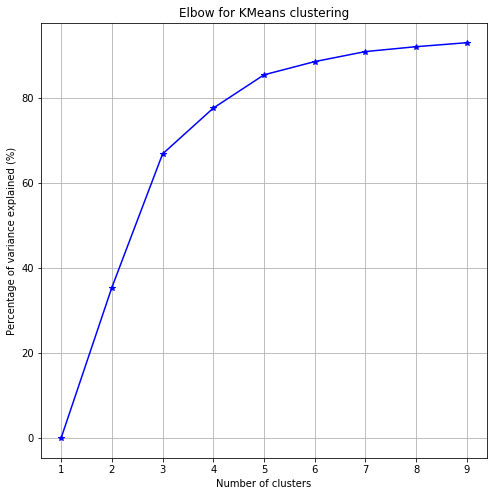

In [132]:
def plot_elbow(kmean, X):
    centroids = [k.cluster_centers_ for k in kmean]
    D_k = [cdist(X, center, 'euclidean') for center in centroids]
    dist = [np.min(D,axis=1) for D in D_k]

    # Total with-in sum of square
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(X)**2)/X.shape[0]
    bss = tss-wcss

    plt.subplots(nrows=1, ncols=1, figsize=(8,8))
    ax = plt.subplot(1, 1, 1)
    ax.plot(Ks, bss/tss*100, 'b*-')
    plt.grid(True)
    plt.xlabel('Number of clusters')
    plt.ylabel('Percentage of variance explained (%)')
    plt.title('Elbow for KMeans clustering')
    plt.show()

plot_elbow(kmean, X)

In [133]:
def plot_stations_map(ax, stns, lon, lat):
    # plot points
    clist = list(stns['cluster'].unique())
    if -1 in clist:
        clist.remove(-1)
    k = len(clist)
    colors = iter(cm.Set1(np.linspace(0, 1, max(10, k))))
    for i in range(k):
        color = next(colors)
        df = stns.loc[stns['cluster'] == clist[i]]        
        #print("Cluster {} has {} samples.".format(clist[i], df.shape[0]))
        
        # convert lat and lon to map projection coordinates       
        ax.scatter(df[lon], df[lat],
                   marker = 'o', color=color, edgecolor='gray', zorder=5, alpha=1.0, s=15)

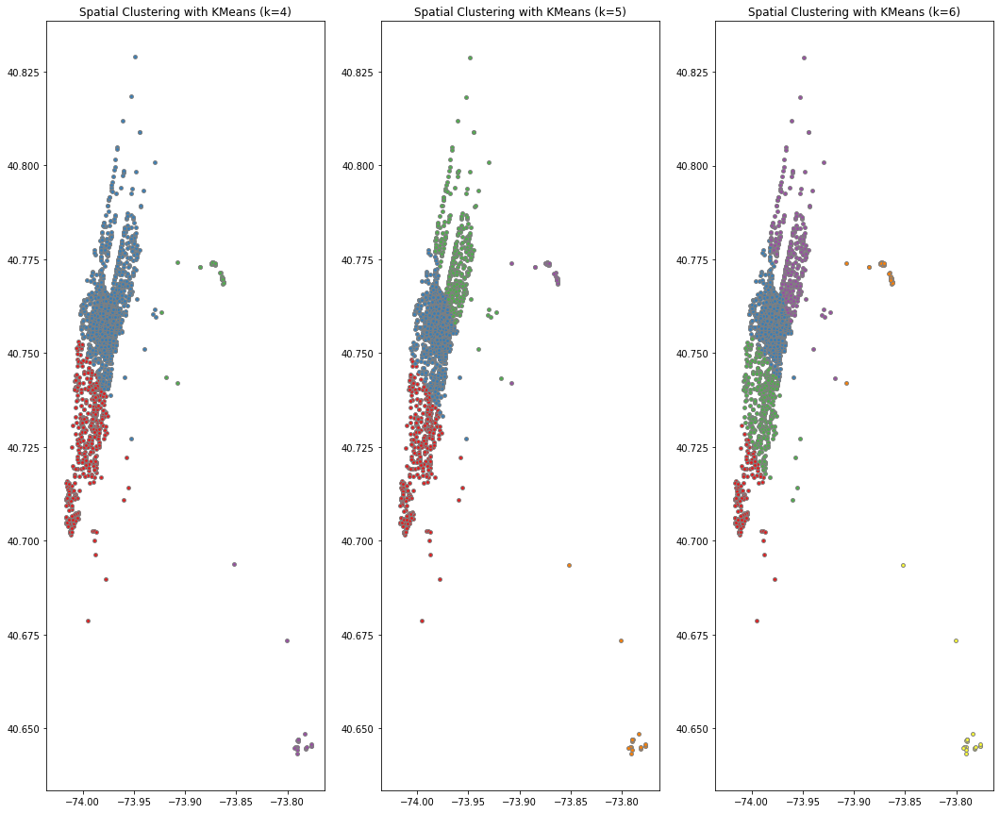

In [212]:
k = [4, 5, 6]
n = len(k)
plt.subplots(nrows=1, ncols=3, figsize=(18,15))

for i in range(n):
    est = kmean[k[i]-1]
    df_clst['cluster'] = est.predict(X).tolist()
    
    ax = plt.subplot(1, 3, i+1)
    ax.set_title("Spatial Clustering with KMeans (k={})".format(k[i]))

    plot_stations_map(ax, df_clst, 'pickup_longitude', 'pickup_latitude')

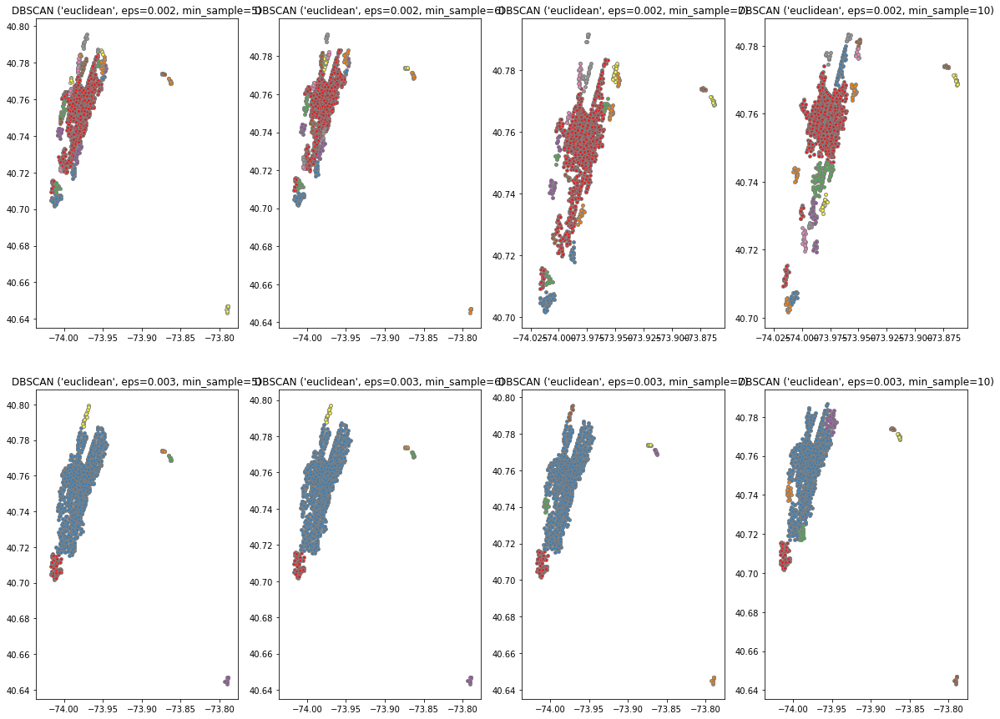

In [137]:
eps = [0.002, 0.003]   # unit: latitude/longitude
min_sample = [5,6,7,10]
n1, n2 = len(eps), len(min_sample)
plt.subplots(nrows=n1, ncols=n2, figsize=(20, 15))


for i in range(n1):
    for j in range(n2):
        est = DBSCAN(eps=eps[i], min_samples=min_sample[j], metric="euclidean").fit(X)
        df_clst['cluster'] = est.labels_.tolist()

        ax = plt.subplot(n1, n2, n2*i+j+1)
        ax.set_title("DBSCAN ('euclidean', eps={}, min_sample={})".format(eps[i], min_sample[j]))
        
        plot_stations_map(ax, df_clst,
                          'pickup_longitude', 'pickup_latitude')

In [143]:
eps = [0.002, 0.003]
n1 = len(eps)
n2 = 1

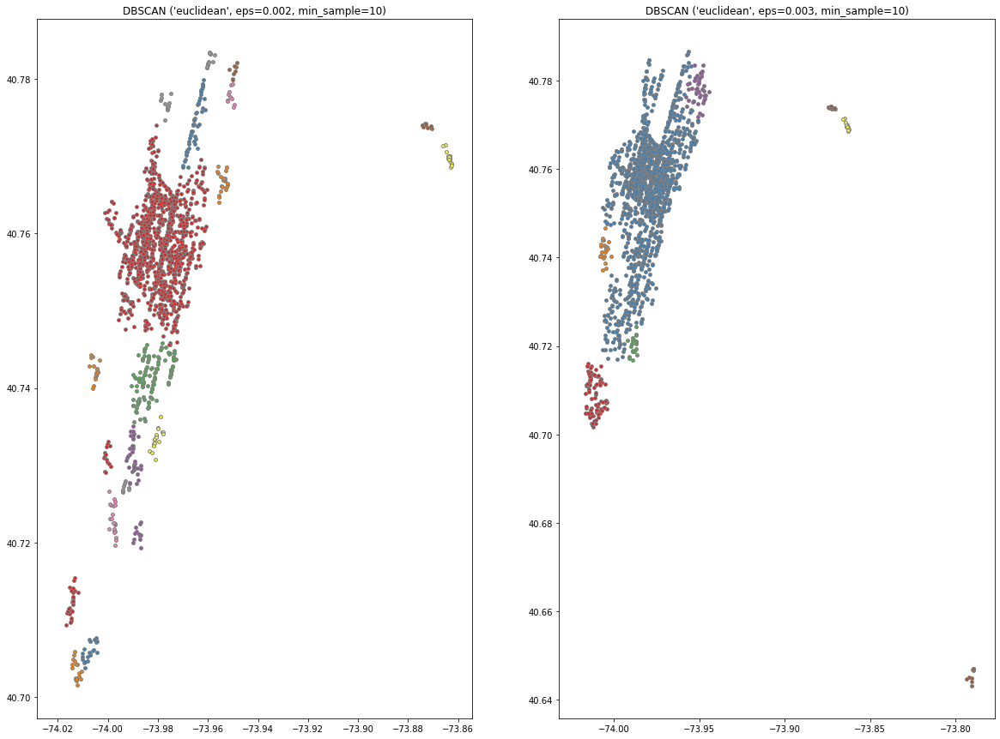

In [147]:
plt.subplots(nrows=1, ncols=2, figsize=(20, 15))
for i in range(n1):
    est = DBSCAN(eps=eps[i], min_samples=10, metric="euclidean").fit(X)
    df_clst['cluster'] = est.labels_.tolist()

    ax = plt.subplot(n2, n1, n2*i+1)
    ax.set_title("DBSCAN ('euclidean', eps={}, min_sample=10)".format(eps[i]))
        
    plot_stations_map(ax, df_clst,
                          'pickup_longitude', 'pickup_latitude')

In [152]:
est1 = DBSCAN(eps=0.002, min_samples=10, metric="euclidean").fit(X)
est2 = DBSCAN(eps=0.003, min_samples=10, metric="euclidean").fit(X)
df_clst['cluster_1'] = est1.labels_.tolist()
df_clst['cluster_2'] = est2.labels_.tolist()

In [156]:
df_clst = df_clst.reset_index()
df_clst.head()

,index,pickup_longitude,pickup_latitude,lat,lon,cluster,cluster_1,cluster_2
0,799262,-74.014603,40.709862,40.7099,-74.0146,0,0,0
1,74127,-73.970879,40.761059,40.7611,-73.9709,1,1,1
2,575283,-73.998886,40.729904,40.7299,-73.9989,1,14,1
3,973439,-73.978058,40.786640,40.7866,-73.9781,-1,-1,-1
4,805930,-73.983818,40.748310,40.7483,-73.9838,1,1,1


In [159]:
f = {'pickup_longitude':'mean',
     'pickup_latitude':'mean',
      'index':'count'}

In [164]:
df_clst1 = df_clst.groupby('cluster_1').agg(f).reset_index()

df_clst1.head()

,cluster_1,pickup_longitude,pickup_latitude,index
0,-1,-73.974614,40.748442,484
1,0,-74.014627,40.712126,30
2,1,-73.979357,40.758375,1355
3,2,-73.965030,40.774554,61
4,3,-73.984671,40.740907,92


In [165]:
df_clst1 = df_clst.groupby('cluster_2').agg(f).reset_index()

df_clst1.head()

,cluster_2,pickup_longitude,pickup_latitude,index
0,-1,-73.959427,40.755165,130
1,0,-74.011720,40.708619,98
2,1,-73.980197,40.755747,1949
3,2,-73.988549,40.720226,21
4,3,-74.005567,40.741628,29


In [211]:
m = folium.Map(location=[40.730610, -73.935242], zoom_start=11, tiles='cartodbpositron')

for i in range(0,len(df_clst1)):
   folium.Circle(
      location=[df_clst1.iloc[i]['pickup_latitude'], df_clst1.iloc[i]['pickup_longitude']],
      popup= 'Count of pickup:\n ' + df_clst1.iloc[i]['index'].astype(int).astype(str),
      radius=((df_clst1.iloc[i]['index'])**0.8)*np.log10(df_clst1.iloc[i]['index']),
      color='purple',
      fill=True,
      fill_color='purple'
   ).add_to(m)
 
m
